In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.size"] = 15 # 글꼴 크기 설정
plt.rcParams["font.family"] = "NanumGothicCoding" # 글꼴 설정
import seaborn as sns
from plotnine import *
import missingno as msno
import folium

전국 도시 공원 정보표준 데이터  
공공데이터포털(https://www.data.go.kr/) 소상공인시장진흥공단_상가(상권)정보 검색

In [2]:
park = pd.read_csv('./data/park_202212.csv', encoding='euc-kr')
park

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,공원보유시설(운동시설),공원보유시설(유희시설),공원보유시설(편익시설),공원보유시설(교양시설),공원보유시설(기타시설),지정고시일,관리기관명,전화번호,데이터기준일자,제공기관코드,제공기관명
0,47190-00127,백현체육공원,체육공원,NaN,경상북도 구미시 산동면 백현리 79,36.186429,128.478491,90967.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-06-09,5080000,경상북도 구미시
1,47190-00128,둘모아공원,어린이공원,NaN,경상북도 구미시 봉곡동 584-2,36.148431,128.316594,4279.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-06-09,5080000,경상북도 구미시
2,47190-00129,다붓소공원,소공원,NaN,경상북도 구미시 봉곡동 765 일원,36.155883,128.311526,805.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-06-09,5080000,경상북도 구미시
3,47190-00130,다붓1공원,어린이공원,NaN,경상북도 구미시 봉곡동 457-1,36.156392,128.314372,1585.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-06-09,5080000,경상북도 구미시
4,47190-00131,다붓2공원,어린이공원,NaN,경상북도 구미시 봉곡동 767,36.154808,128.314372,1637.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-06-09,5080000,경상북도 구미시
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17460,41461-00025,삼가지구 어린이공원1,어린이공원,NaN,경기도 용인시 처인구 삼가동 288-1,37.238001,127.164249,4878.0,NaN,NaN,NaN,NaN,NaN,2008-10-02,NaN,NaN,2022-11-23,4050000,경기도 용인시
17461,41461-00026,삼가1지구 체육공원,체육공원,NaN,경기도 용인시 처인구 삼가동 268-26,37.238235,127.169302,17748.0,NaN,NaN,NaN,NaN,NaN,2008-10-02,NaN,NaN,2022-11-23,4050000,경기도 용인시
17462,41461-00027,제107호 어린이공원,어린이공원,NaN,경기도 용인시 처인구 모현읍 왕산리 949,37.333938,127.253862,5817.0,NaN,NaN,NaN,NaN,NaN,2008-10-06,NaN,NaN,2022-11-23,4050000,경기도 용인시
17463,41461-00028,제105호 어린이공원,어린이공원,NaN,경기도 용인시 처인구 포곡읍 둔전리450,37.272922,127.221799,2558.0,NaN,NaN,NaN,NaN,NaN,2008-10-06,NaN,NaN,2022-11-23,4050000,경기도 용인시


In [3]:
park.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17465 entries, 0 to 17464
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   관리번호          17465 non-null  object 
 1   공원명           17465 non-null  object 
 2   공원구분          17465 non-null  object 
 3   소재지도로명주소      4114 non-null   object 
 4   소재지지번주소       17126 non-null  object 
 5   위도            17425 non-null  float64
 6   경도            17426 non-null  float64
 7   공원면적          17465 non-null  float64
 8   공원보유시설(운동시설)  4849 non-null   object 
 9   공원보유시설(유희시설)  6170 non-null   object 
 10  공원보유시설(편익시설)  4848 non-null   object 
 11  공원보유시설(교양시설)  807 non-null    object 
 12  공원보유시설(기타시설)  2585 non-null   object 
 13  지정고시일         14552 non-null  object 
 14  관리기관명         15956 non-null  object 
 15  전화번호          16194 non-null  object 
 16  데이터기준일자       17465 non-null  object 
 17  제공기관코드        17465 non-null  object 
 18  제공기관명         17465 non-nu

In [4]:
park.isnull().sum()

관리번호                0
공원명                 0
공원구분                0
소재지도로명주소        13351
소재지지번주소           339
위도                 40
경도                 39
공원면적                0
공원보유시설(운동시설)    12616
공원보유시설(유희시설)    11295
공원보유시설(편익시설)    12617
공원보유시설(교양시설)    16658
공원보유시설(기타시설)    14880
지정고시일            2913
관리기관명            1509
전화번호             1271
데이터기준일자             0
제공기관코드              0
제공기관명               0
dtype: int64

<AxesSubplot:>

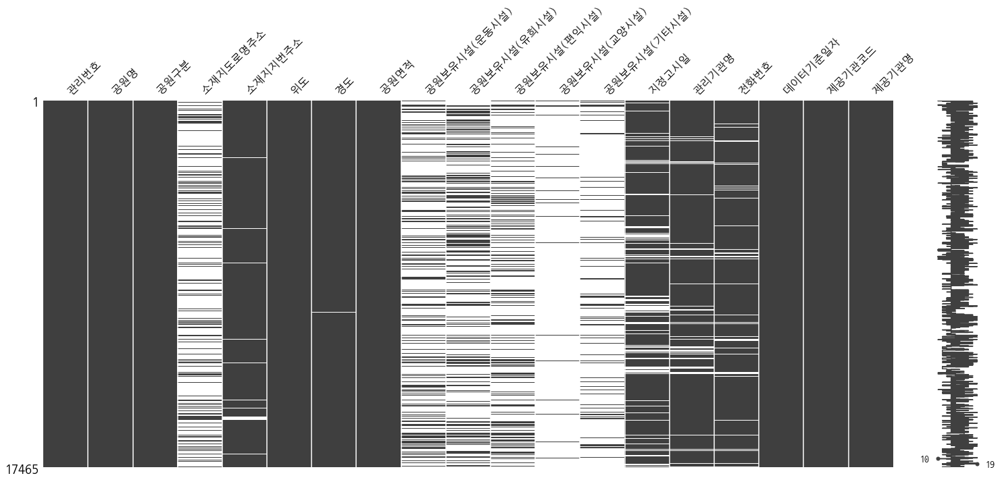

In [5]:
msno.matrix(park)

In [6]:
park.columns

Index(['관리번호', '공원명', '공원구분', '소재지도로명주소', '소재지지번주소', '위도', '경도', '공원면적',
       '공원보유시설(운동시설)', '공원보유시설(유희시설)', '공원보유시설(편익시설)', '공원보유시설(교양시설)',
       '공원보유시설(기타시설)', '지정고시일', '관리기관명', '전화번호', '데이터기준일자', '제공기관코드', '제공기관명'],
      dtype='object')

In [7]:
# drop() 함수로 불필요한 컬럼을 제공한다.
# columns 속성에 제거할 열 이름을 지정한다. 단, 제거할 열이 2개 이상일 경우 []로 묶어서 리스트로 넘겨야 한다.
park.drop(columns=['공원보유시설(운동시설)', '공원보유시설(유희시설)', '공원보유시설(편익시설)', 
                   '공원보유시설(교양시설)', '공원보유시설(기타시설)', '지정고시일', '관리기관명'], inplace=True)

In [8]:
park.columns

Index(['관리번호', '공원명', '공원구분', '소재지도로명주소', '소재지지번주소', '위도', '경도', '공원면적',
       '전화번호', '데이터기준일자', '제공기관코드', '제공기관명'],
      dtype='object')

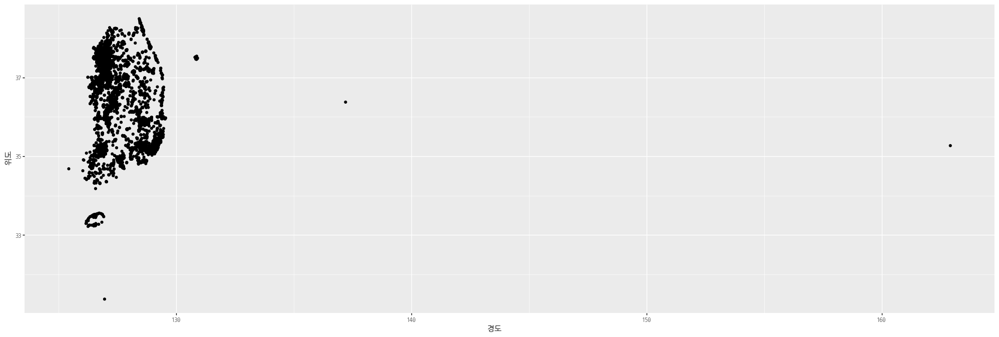

<ggplot: (-9223371931356228576)>

In [9]:
(
    ggplot(park, aes(x='경도', y='위도'))
        + geom_point()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(25, 8))
)

<AxesSubplot:xlabel='경도', ylabel='위도'>

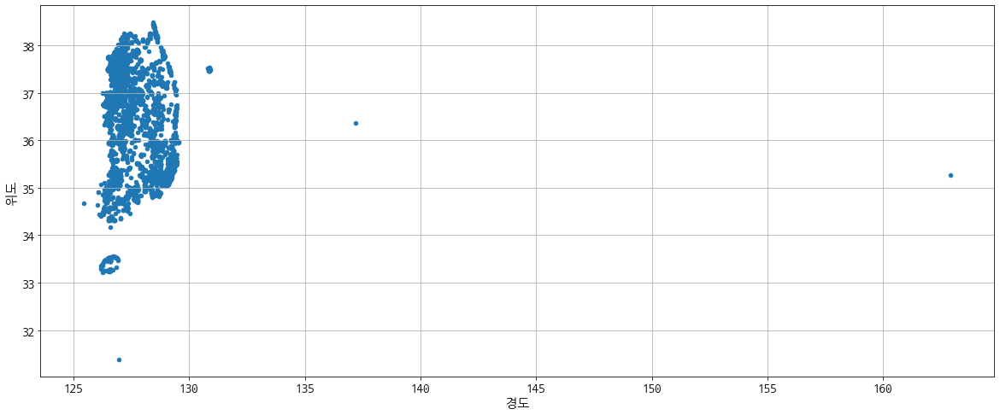

In [10]:
park.plot.scatter(x='경도', y='위도', grid=True, figsize=(20, 8))

주소 데이터 전처리

In [11]:
park.dtypes

관리번호         object
공원명          object
공원구분         object
소재지도로명주소     object
소재지지번주소      object
위도          float64
경도          float64
공원면적        float64
전화번호         object
데이터기준일자      object
제공기관코드       object
제공기관명        object
dtype: object

In [12]:
park.공원면적

0        90967.0
1         4279.0
2          805.0
3         1585.0
4         1637.0
          ...   
17460     4878.0
17461    17748.0
17462     5817.0
17463     2558.0
17464    15741.0
Name: 공원면적, Length: 17465, dtype: float64

In [13]:
# CircleMarker를 표시하기 위해 '공원면적' 열을 적당한 수식을 실행해서 '공원면적비율'열을 만든다.
# 시리즈.apply(lambda 변수 : 수식)
# 시리즈에 저장된 데이터가 lambda 뒤의 변수로 한 건식 전달되고 ':' 다음의 수식을 실행한 후 apply() 함수에 의해서 일괄 적용된다. 
park['공원면적비율'] = park['공원면적'].apply(lambda x: np.sqrt(x) * 0.01)

In [14]:
park

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율
0,47190-00127,백현체육공원,체육공원,NaN,경상북도 구미시 산동면 백현리 79,36.186429,128.478491,90967.0,NaN,2022-06-09,5080000,경상북도 구미시,3.016074
1,47190-00128,둘모아공원,어린이공원,NaN,경상북도 구미시 봉곡동 584-2,36.148431,128.316594,4279.0,NaN,2022-06-09,5080000,경상북도 구미시,0.654141
2,47190-00129,다붓소공원,소공원,NaN,경상북도 구미시 봉곡동 765 일원,36.155883,128.311526,805.0,NaN,2022-06-09,5080000,경상북도 구미시,0.283725
3,47190-00130,다붓1공원,어린이공원,NaN,경상북도 구미시 봉곡동 457-1,36.156392,128.314372,1585.0,NaN,2022-06-09,5080000,경상북도 구미시,0.398121
4,47190-00131,다붓2공원,어린이공원,NaN,경상북도 구미시 봉곡동 767,36.154808,128.314372,1637.0,NaN,2022-06-09,5080000,경상북도 구미시,0.404599
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17460,41461-00025,삼가지구 어린이공원1,어린이공원,NaN,경기도 용인시 처인구 삼가동 288-1,37.238001,127.164249,4878.0,NaN,2022-11-23,4050000,경기도 용인시,0.698427
17461,41461-00026,삼가1지구 체육공원,체육공원,NaN,경기도 용인시 처인구 삼가동 268-26,37.238235,127.169302,17748.0,NaN,2022-11-23,4050000,경기도 용인시,1.332216
17462,41461-00027,제107호 어린이공원,어린이공원,NaN,경기도 용인시 처인구 모현읍 왕산리 949,37.333938,127.253862,5817.0,NaN,2022-11-23,4050000,경기도 용인시,0.762693
17463,41461-00028,제105호 어린이공원,어린이공원,NaN,경기도 용인시 처인구 포곡읍 둔전리450,37.272922,127.221799,2558.0,NaN,2022-11-23,4050000,경기도 용인시,0.505767


In [15]:
# 도로명 주소가 NaN인 데이터의 개수 => 지번 주소만 입력된 데이터의 개수
# 도로명 주소만 입력되고 지번 주소가 입력되지 않은 데이터는 도로명 주소 제도가 실행되고 난 후 조성된 공원이다.
park['소재지도로명주소'].isnull().sum()

13351

In [16]:
# 도로명 주소는 입력되지 않고 지번 주소만 입력된 데이터
# 불린 인덱싱 작업시 and 조건이나 or 조건이 사용되면 and(&) 또는 or(|) 연산에 참여하는 데이터에 관계 연산자가 사용되면 ()로 묶어준다.
# park[(park['소재지도로명주소'].isnull() == True) & (park['소재지지번주소'].notnull() == True)]
park[(park['소재지도로명주소'].isnull()) & (park['소재지지번주소'].notnull())]

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율
0,47190-00127,백현체육공원,체육공원,NaN,경상북도 구미시 산동면 백현리 79,36.186429,128.478491,90967.0,NaN,2022-06-09,5080000,경상북도 구미시,3.016074
1,47190-00128,둘모아공원,어린이공원,NaN,경상북도 구미시 봉곡동 584-2,36.148431,128.316594,4279.0,NaN,2022-06-09,5080000,경상북도 구미시,0.654141
2,47190-00129,다붓소공원,소공원,NaN,경상북도 구미시 봉곡동 765 일원,36.155883,128.311526,805.0,NaN,2022-06-09,5080000,경상북도 구미시,0.283725
3,47190-00130,다붓1공원,어린이공원,NaN,경상북도 구미시 봉곡동 457-1,36.156392,128.314372,1585.0,NaN,2022-06-09,5080000,경상북도 구미시,0.398121
4,47190-00131,다붓2공원,어린이공원,NaN,경상북도 구미시 봉곡동 767,36.154808,128.314372,1637.0,NaN,2022-06-09,5080000,경상북도 구미시,0.404599
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17460,41461-00025,삼가지구 어린이공원1,어린이공원,NaN,경기도 용인시 처인구 삼가동 288-1,37.238001,127.164249,4878.0,NaN,2022-11-23,4050000,경기도 용인시,0.698427
17461,41461-00026,삼가1지구 체육공원,체육공원,NaN,경기도 용인시 처인구 삼가동 268-26,37.238235,127.169302,17748.0,NaN,2022-11-23,4050000,경기도 용인시,1.332216
17462,41461-00027,제107호 어린이공원,어린이공원,NaN,경기도 용인시 처인구 모현읍 왕산리 949,37.333938,127.253862,5817.0,NaN,2022-11-23,4050000,경기도 용인시,0.762693
17463,41461-00028,제105호 어린이공원,어린이공원,NaN,경기도 용인시 처인구 포곡읍 둔전리450,37.272922,127.221799,2558.0,NaN,2022-11-23,4050000,경기도 용인시,0.505767


In [17]:
# 지번 주소가 NaN인 데이터의 개수 => 도로명 주소만 입력된 데이터의 개수
park['소재지지번주소'].isnull().sum()

339

In [18]:
# 도로면 주소는 입력되고 지번 주소가 입력되지 않은 데이터
park[(park['소재지도로명주소'].notnull()) & (park['소재지지번주소'].isnull())]

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율
145,41360-00078,별내택지어린이공원3,어린이공원,경기도 남양주시 별내동 별내3로 285,NaN,37.662716,127.116471,2743.0,031-590-8601,2022-12-07,3990000,경기도 남양주시,0.523737
599,45800-00001,서림공원,근린공원,"전라북도 부안군 부안읍 동중리, 서외리, 행안면 역리 190전 일원",NaN,35.732919,126.731487,408986.0,063-580-4644,2022-05-26,4790000,전라북도 부안군,6.395201
1561,46150-00018,내동공원,어린이공원,전라남도 순천시 승주읍 서평내동1길 26,NaN,35.015910,127.388269,3515.0,061-749-6330,2021-09-01,4820000,전라남도 순천시,0.592874
1562,46150-00019,승평공원,어린이공원,전라남도 순천시 승주읍 승평동길 46,NaN,35.018377,127.376535,2600.0,061-749-6330,2021-09-01,4820000,전라남도 순천시,0.509902
1563,46150-00020,동내공원,근린공원,전라남도 순천시 낙안면 삼일로 71,NaN,34.904578,127.343855,6700.0,061-749-8831,2021-09-01,4820000,전라남도 순천시,0.818535
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15914,28260-00006,여우재공원(이름변경),어린이공원,인천광역시 서구 고래울로 6,NaN,37.488595,126.683657,1501.0,032-560-4800,2022-08-02,3560000,인천광역시 서구,0.387427
15915,28260-00007,가좌울공원,어린이공원,인천광역시 서구 고래울로 35,NaN,37.486735,126.685936,1920.0,032-560-4800,2022-08-02,3560000,인천광역시 서구,0.438178
15917,28260-00009,가좌공원,어린이공원,인천광역시 서구 고래울로 12,NaN,37.487925,126.684202,7280.0,032-560-4800,2022-08-02,3560000,인천광역시 서구,0.853229
15920,28260-00012,가정공원,어린이공원,인천광역시 서구 가정로 406번길 10,NaN,37.520940,126.674269,6612.0,032-560-4800,2022-08-02,3560000,인천광역시 서구,0.813142


In [19]:
# 도로명 주소와 지번 주소가 모두 입력된 데이터
park[(park['소재지도로명주소'].notnull()) & (park['소재지지번주소'].notnull())]

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율
6,47190-00133,산림문화생태근린공원,근린공원,경상북도 구미시 인덕1길 240,경상북도 구미시 산동면 인덕리 산 5-1,36.165099,128.460465,1059228.0,NaN,2022-06-09,5080000,경상북도 구미시,10.291880
81,41370-00109,원동수변공원,수변공원,경기도 오산시 부원로87번길 51,경기도 오산시 원동 715-8,37.140907,127.091507,17788.0,031-8036-6473,2022-04-30,4000000,경기도 오산시,1.333717
82,41370-00110,가장동체육공원,체육공원,경기도 오산시 가장산업동로 49,경기도 오산시 가장동 382-4,37.164782,127.041189,11856.0,031-8036-6473,2022-04-30,4000000,경기도 오산시,1.088853
97,31140-00015,헐수정공원,어린이공원,울산광역시 남구 신복로23번길 16,울산광역시 남구 무거동 837,35.547388,129.258582,4078.6,052-226-5903,2022-03-31,3700000,울산광역시 남구,0.638639
107,41430-00111,근린공원,근린공원,경기도 의왕시 초평동 19-1,경기도 의왕시 초평동 19-1,37.318538,126.944477,14234.0,031-345-3083,2022-06-13,4030000,경기도 의왕시,1.193063
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17421,42820-00013,화포3거리 공원,소공원,강원도 고성군 현내면 화진포길 204-25,강원도 고성군 거진읍 화포리 496,38.460685,128.443610,500.0,033-680-3423,2022-12-01,4340000,강원도 고성군,0.223607
17426,42820-00018,초도리 통일공원,소공원,강원도 고성군 현내면 금강산로 186,강원도 고성군 현내면 초도리 산2-2,38.491555,128.428343,5631.0,033-680-3423,2022-12-01,4340000,강원도 고성군,0.750400
17436,41461-00001,제11호 근린공원(용인중앙공원),근린공원,경기도 용인시 처인구 백옥대로1081번길 5-2,경기도 용인시 처인구 김량장동 산37-16,37.231706,127.208376,579879.0,NaN,2022-11-23,4050000,경기도 용인시,7.614979
17437,41461-00002,제32호 근린공원(번암공원),근린공원,경기도 용인시 처인구 금학로277번길 16,경기도 용인시 처인구 역북동 733,37.239140,127.194987,58886.0,NaN,2022-11-23,4050000,경기도 용인시,2.426644


In [20]:
# 도로명 주소와 지번 주소가 모두 입력되지 않은 데이터
park[(park['소재지도로명주소'].isnull()) & (park['소재지지번주소'].isnull())]

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율


In [21]:
# 도로명 주소에 입력된 '-'를 (경상북도 칠곡군) 누락값으로 변경한다.
park.loc[park['소재지도로명주소'] == '-', '소재지도로명주소'] = np.NaN

In [22]:
park[park['제공기관명'] == '경상북도 칠곡군']

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율
11191,47850-00001,동락공원,근린공원,NaN,경상북도 칠곡군 석적읍 중리 495-5,36.086275,128.400711,95958.0,NaN,2020-07-16,5220000,경상북도 칠곡군,3.097709
11192,47850-00002,인평제2공원(한마음공원),어린이공원,NaN,경상북도 칠곡군 북삼읍 인평리 705-3,36.063460,128.333056,1988.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.445870
11193,47850-00003,인평제3공원(허브공원),어린이공원,NaN,경상북도 칠곡군 북삼읍 숭오리 15-1,36.069315,128.333963,1586.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.398246
11194,47850-00004,인평제4공원(그루터기공원),어린이공원,NaN,경상북도 칠곡군 북삼읍 인평리 676-1,36.068418,128.340790,3875.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.622495
11195,47850-00005,인평제5공원(해오름1공원),어린이공원,NaN,경상북도 칠곡군 북삼읍 인평리 1087,36.068779,128.349499,3629.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.602412
12389,47850-00024,남율제2공원,어린이공원,NaN,경상북도 칠곡군 석적읍 남율리 산38,36.070102,128.409498,3406.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.583609
12390,47850-00025,남율제3공원,어린이공원,NaN,경상북도 칠곡군 석적읍 남율리 235,36.064404,128.402607,4413.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.664304
12391,47850-00026,남율제4공원,어린이공원,NaN,경상북도 칠곡군 석적읍 남율리 산 45-13,36.066446,128.409255,2033.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.450888
12392,47850-00027,남율제5공원,어린이공원,NaN,경상북도 칠곡군 석적읍 남율리 산 44-20,36.067938,128.411450,3516.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.592959
12393,47850-00028,중리제7공원(장승백이공원),어린이공원,NaN,경상북도 칠곡군 석적읍 중리 161-16,36.077882,128.401534,2285.0,054-979-6832,2020-07-16,5220000,경상북도 칠곡군,0.478017


In [23]:
# 도로명 주소가 NaN인 데이터를 지번주소로 채운다
park['소재지도로명주소'].fillna(park['소재지지번주소'], inplace=True)

In [24]:
park['소재지도로명주소'].isnull().sum()

0

주소 데이터 전처리 => 도로명 주소에서 공백을 경계로 주소를 분리해서 4번째 레벨까지 추가한다.

In [25]:
park['소재지도로명주소'].str.split(' ', expand=True)

,0,1,2,3,4,5,6,7,8
0,경상북도,구미시,산동면,백현리,79,None,None,None,None
1,경상북도,구미시,봉곡동,584-2,None,None,None,None,None
2,경상북도,구미시,봉곡동,765,일원,None,None,None,None
3,경상북도,구미시,봉곡동,457-1,None,None,None,None,None
4,경상북도,구미시,봉곡동,767,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...
17460,경기도,용인시,처인구,삼가동,288-1,None,None,None,None
17461,경기도,용인시,처인구,삼가동,268-26,None,None,None,None
17462,경기도,용인시,처인구,모현읍,왕산리,949,None,None,None
17463,경기도,용인시,처인구,포곡읍,둔전리450,None,None,None,None


In [26]:
set(park['소재지도로명주소'].str.split(' ', expand=True)[0])

{'강원도',
 '경기도',
 '경상남도',
 '경상북도',
 '광주광역시',
 '대구광역시',
 '대전',
 '대전광역시',
 '부산광역시',
 '서울특별시',
 '세종특별자치시',
 '울산광역시',
 '인천광역시',
 '전라남도',
 '전라북도',
 '제주특별자치도',
 '충청남도',
 '충청북도'}

In [27]:
# 도로명 주소에서 공백으로 분리한 주소를 4번째 레벨까지 추가한다.
park['시도'] = park['소재지도로명주소'].str.split(' ', expand=True)[0]
park['주소2'] = park['소재지도로명주소'].str.split(' ', expand=True)[1]
park['주소3'] = park['소재지도로명주소'].str.split(' ', expand=True)[2]
park['주소4'] = park['소재지도로명주소'].str.split(' ', expand=True)[3]
park

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율,시도,주소2,주소3,주소4
0,47190-00127,백현체육공원,체육공원,경상북도 구미시 산동면 백현리 79,경상북도 구미시 산동면 백현리 79,36.186429,128.478491,90967.0,NaN,2022-06-09,5080000,경상북도 구미시,3.016074,경상북도,구미시,산동면,백현리
1,47190-00128,둘모아공원,어린이공원,경상북도 구미시 봉곡동 584-2,경상북도 구미시 봉곡동 584-2,36.148431,128.316594,4279.0,NaN,2022-06-09,5080000,경상북도 구미시,0.654141,경상북도,구미시,봉곡동,584-2
2,47190-00129,다붓소공원,소공원,경상북도 구미시 봉곡동 765 일원,경상북도 구미시 봉곡동 765 일원,36.155883,128.311526,805.0,NaN,2022-06-09,5080000,경상북도 구미시,0.283725,경상북도,구미시,봉곡동,765
3,47190-00130,다붓1공원,어린이공원,경상북도 구미시 봉곡동 457-1,경상북도 구미시 봉곡동 457-1,36.156392,128.314372,1585.0,NaN,2022-06-09,5080000,경상북도 구미시,0.398121,경상북도,구미시,봉곡동,457-1
4,47190-00131,다붓2공원,어린이공원,경상북도 구미시 봉곡동 767,경상북도 구미시 봉곡동 767,36.154808,128.314372,1637.0,NaN,2022-06-09,5080000,경상북도 구미시,0.404599,경상북도,구미시,봉곡동,767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17460,41461-00025,삼가지구 어린이공원1,어린이공원,경기도 용인시 처인구 삼가동 288-1,경기도 용인시 처인구 삼가동 288-1,37.238001,127.164249,4878.0,NaN,2022-11-23,4050000,경기도 용인시,0.698427,경기도,용인시,처인구,삼가동
17461,41461-00026,삼가1지구 체육공원,체육공원,경기도 용인시 처인구 삼가동 268-26,경기도 용인시 처인구 삼가동 268-26,37.238235,127.169302,17748.0,NaN,2022-11-23,4050000,경기도 용인시,1.332216,경기도,용인시,처인구,삼가동
17462,41461-00027,제107호 어린이공원,어린이공원,경기도 용인시 처인구 모현읍 왕산리 949,경기도 용인시 처인구 모현읍 왕산리 949,37.333938,127.253862,5817.0,NaN,2022-11-23,4050000,경기도 용인시,0.762693,경기도,용인시,처인구,모현읍
17463,41461-00028,제105호 어린이공원,어린이공원,경기도 용인시 처인구 포곡읍 둔전리450,경기도 용인시 처인구 포곡읍 둔전리450,37.272922,127.221799,2558.0,NaN,2022-11-23,4050000,경기도 용인시,0.505767,경기도,용인시,처인구,포곡읍


위도, 경도 전처리 => 대한민국 범위를 벗어난 위도와 경도를 찾아 처리한다.

In [28]:
park[['위도', '경도']].describe()

,위도,경도
count,17425.000000,17426.000000
mean,36.502085,127.456778
std,1.031458,0.882256
min,31.373336,125.432215
25%,35.560778,126.864593
50%,36.784219,127.095656
75%,37.431027,127.959183
max,38.491555,162.920004


In [29]:
# 위도와 경도가 잘못 입력된 데이터를 추출한다.
park[(park['위도'] < 32) | (park['경도'] > 135)]

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율,시도,주소2,주소3,주소4
10911,43113-00080,근린공원5(만수공원),근린공원,충청북도 청주시 흥덕구 오송읍 만수리 512,충청북도 청주시 흥덕구 오송읍 만수리 512,36.374204,137.202661,33258.0,043-201-4433,2020-07-16,5710000,충청북도 청주시,1.823678,충청북도,청주시,흥덕구,오송읍
13860,46710-00112,공원-112,소공원,전라남도 담양군 대전면 성산리 434-13,전라남도 담양군 대전면 성산리 434-13,35.269633,162.920004,743.0,061-380-2574,2022-02-07,4850000,전라남도 담양군,0.272580,전라남도,담양군,대전면,성산리
14633,41173-00113,제24호소공원,소공원,경기도 안양시 동안구 호계동 1308,경기도 안양시 동안구 호계동 1308,31.373336,126.954253,2159.0,031-8045-5022,2022-11-15,3830000,경기도 안양시,0.464650,경기도,안양시,동안구,호계동


In [30]:
# 위도 또는 경도가 입력되지 않은 데이터를 추출한다.
park[park['위도'].isnull() | park['경도'].isnull()].shape

(56, 17)

In [31]:
# 위도와 경도가 올바른 데이터만 추출한다.
park_ok = park[(park['위도'] >= 32) & (park['경도'] <= 135)]
park_ok

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율,시도,주소2,주소3,주소4
0,47190-00127,백현체육공원,체육공원,경상북도 구미시 산동면 백현리 79,경상북도 구미시 산동면 백현리 79,36.186429,128.478491,90967.0,NaN,2022-06-09,5080000,경상북도 구미시,3.016074,경상북도,구미시,산동면,백현리
1,47190-00128,둘모아공원,어린이공원,경상북도 구미시 봉곡동 584-2,경상북도 구미시 봉곡동 584-2,36.148431,128.316594,4279.0,NaN,2022-06-09,5080000,경상북도 구미시,0.654141,경상북도,구미시,봉곡동,584-2
2,47190-00129,다붓소공원,소공원,경상북도 구미시 봉곡동 765 일원,경상북도 구미시 봉곡동 765 일원,36.155883,128.311526,805.0,NaN,2022-06-09,5080000,경상북도 구미시,0.283725,경상북도,구미시,봉곡동,765
3,47190-00130,다붓1공원,어린이공원,경상북도 구미시 봉곡동 457-1,경상북도 구미시 봉곡동 457-1,36.156392,128.314372,1585.0,NaN,2022-06-09,5080000,경상북도 구미시,0.398121,경상북도,구미시,봉곡동,457-1
4,47190-00131,다붓2공원,어린이공원,경상북도 구미시 봉곡동 767,경상북도 구미시 봉곡동 767,36.154808,128.314372,1637.0,NaN,2022-06-09,5080000,경상북도 구미시,0.404599,경상북도,구미시,봉곡동,767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17460,41461-00025,삼가지구 어린이공원1,어린이공원,경기도 용인시 처인구 삼가동 288-1,경기도 용인시 처인구 삼가동 288-1,37.238001,127.164249,4878.0,NaN,2022-11-23,4050000,경기도 용인시,0.698427,경기도,용인시,처인구,삼가동
17461,41461-00026,삼가1지구 체육공원,체육공원,경기도 용인시 처인구 삼가동 268-26,경기도 용인시 처인구 삼가동 268-26,37.238235,127.169302,17748.0,NaN,2022-11-23,4050000,경기도 용인시,1.332216,경기도,용인시,처인구,삼가동
17462,41461-00027,제107호 어린이공원,어린이공원,경기도 용인시 처인구 모현읍 왕산리 949,경기도 용인시 처인구 모현읍 왕산리 949,37.333938,127.253862,5817.0,NaN,2022-11-23,4050000,경기도 용인시,0.762693,경기도,용인시,처인구,모현읍
17463,41461-00028,제105호 어린이공원,어린이공원,경기도 용인시 처인구 포곡읍 둔전리450,경기도 용인시 처인구 포곡읍 둔전리450,37.272922,127.221799,2558.0,NaN,2022-11-23,4050000,경기도 용인시,0.505767,경기도,용인시,처인구,포곡읍


In [32]:
park_ok['시도'].value_counts()

경기도        4426
충청남도       1762
서울특별시      1759
경상남도       1163
전라남도       1038
경상북도       1019
광주광역시       932
충청북도        789
인천광역시       690
부산광역시       674
전라북도        664
강원도         632
대구광역시       631
울산광역시       467
대전광역시       444
제주특별자치도     245
세종특별자치시      70
대전            1
Name: 시도, dtype: int64

In [33]:
# 주소1 컬럼이 '대전'인 데이터를 '대전광역시'로 수정한다.

In [34]:
# park_ok.loc[park_ok['시도'] == '대전', '시도'] = '대전광역시'
park_ok['시도'][park_ok['시도'] == '대전'] = '대전광역시'
park_ok['시도'].value_counts()

경기도        4426
충청남도       1762
서울특별시      1759
경상남도       1163
전라남도       1038
경상북도       1019
광주광역시       932
충청북도        789
인천광역시       690
부산광역시       674
전라북도        664
강원도         632
대구광역시       631
울산광역시       467
대전광역시       445
제주특별자치도     245
세종특별자치시      70
Name: 시도, dtype: int64

In [35]:
park_ok.loc[park_ok['시도'] == '삽호읍', '시도'] = '삼호읍'
park_ok['시도'].value_counts()

경기도        4426
충청남도       1762
서울특별시      1759
경상남도       1163
전라남도       1038
경상북도       1019
광주광역시       932
충청북도        789
인천광역시       690
부산광역시       674
전라북도        664
강원도         632
대구광역시       631
울산광역시       467
대전광역시       445
제주특별자치도     245
세종특별자치시      70
Name: 시도, dtype: int64

시도별 공원 데이터 시각화

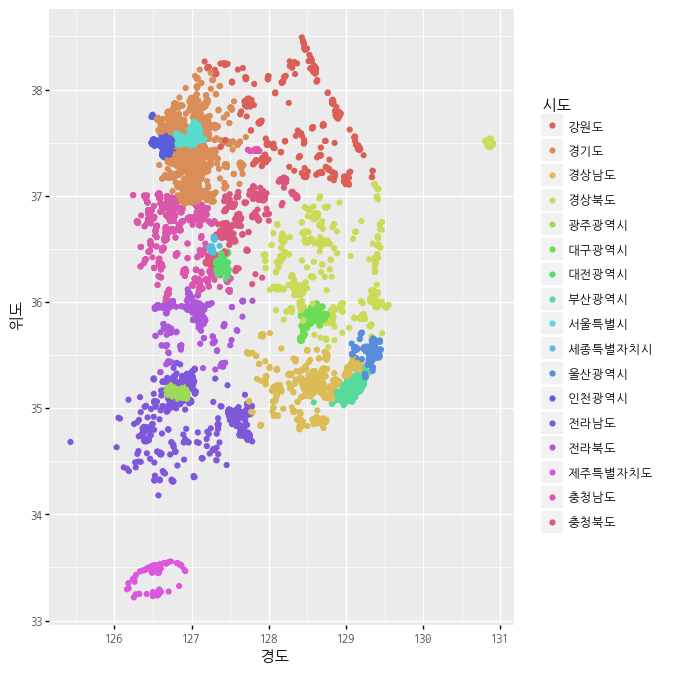

<ggplot: (-9223371931354197160)>

In [36]:
(
    ggplot(park_ok, aes(x='경도', y='위도', color='시도'))
        + geom_point()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(6, 8))
)

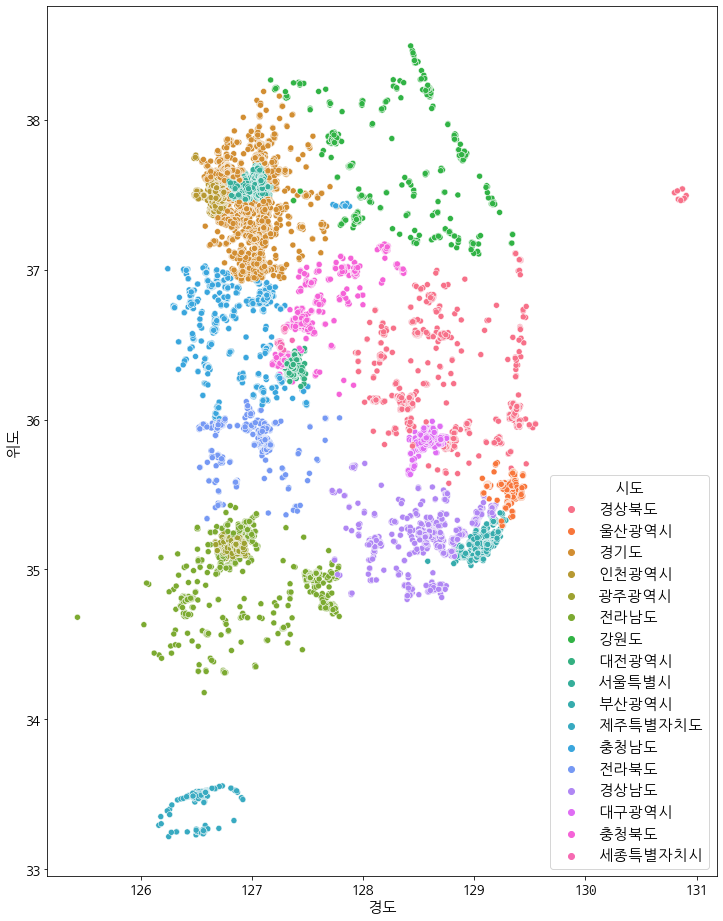

In [37]:
plt.figure(figsize=(12,16))
sns.scatterplot(data=park_ok, x='경도', y='위도', hue='시도')
plt.show()

In [38]:
park_ok['공원구분'].value_counts()

어린이공원       9072
근린공원        3917
소공원         2603
기타           547
문화공원         374
수변공원         326
체육공원         250
역사공원         185
마을마당          49
묘지공원          38
기타공원          30
도시농업공원         7
도시자연공원         3
도시자연공원구역       2
주제공원           2
어린인공원          1
Name: 공원구분, dtype: int64

In [39]:
park_ok.loc[park_ok['공원구분'] == '어린인공원', '공원구분'] = '어린이공원'
park_ok.loc[park_ok['공원구분'] == '기타공원', '공원구분'] = '기타'
park_ok.loc[park_ok['공원구분'] == '도시자연공원구역', '공원구분'] = '도시자연공원'
park_ok['공원구분'].value_counts()

어린이공원     9073
근린공원      3917
소공원       2603
기타         577
문화공원       374
수변공원       326
체육공원       250
역사공원       185
마을마당        49
묘지공원        38
도시농업공원       7
도시자연공원       5
주제공원         2
Name: 공원구분, dtype: int64

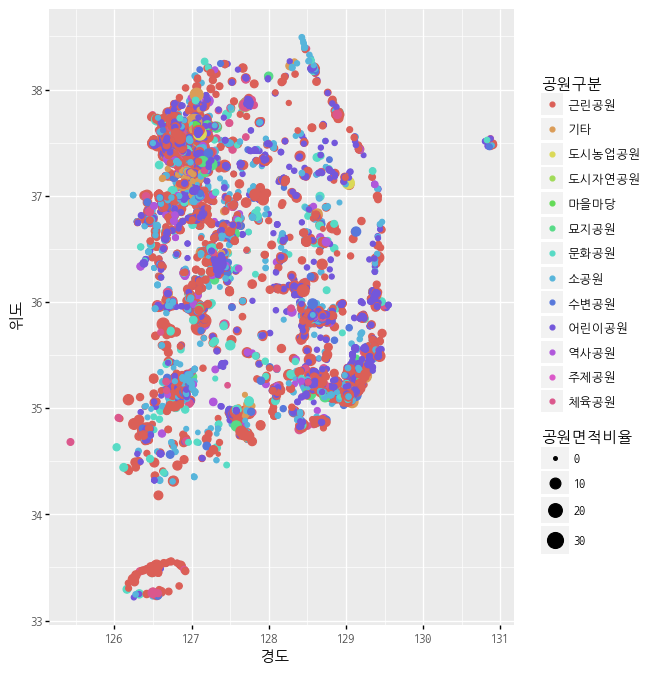

<ggplot: (105496727016)>

In [40]:
(
    ggplot(park_ok, aes(x='경도', y='위도', color='공원구분', size='공원면적비율'))
        + geom_point()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(6, 8))
)

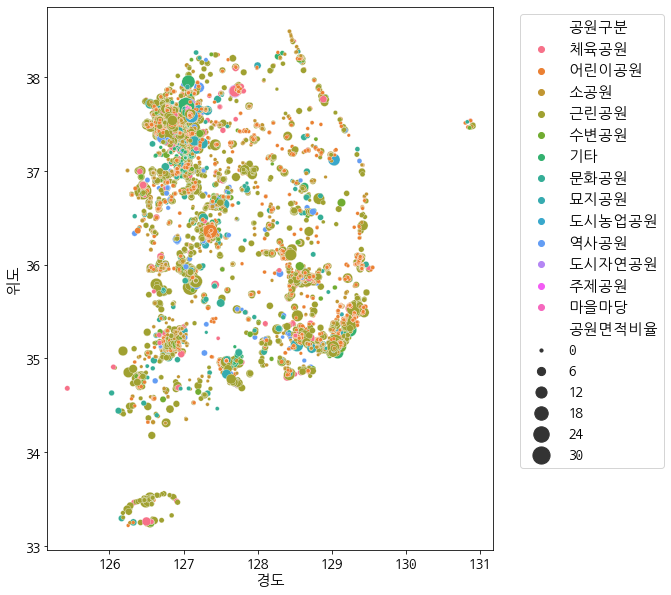

In [41]:
plt.figure(figsize=(8,10))
sns.scatterplot(data=park_ok, x='경도', y='위도', hue='공원구분', size='공원면적비율', sizes=(10, 300))
plt.legend(loc=1, bbox_to_anchor=(1.4, 1.0)) # 범례 위치
plt.show()

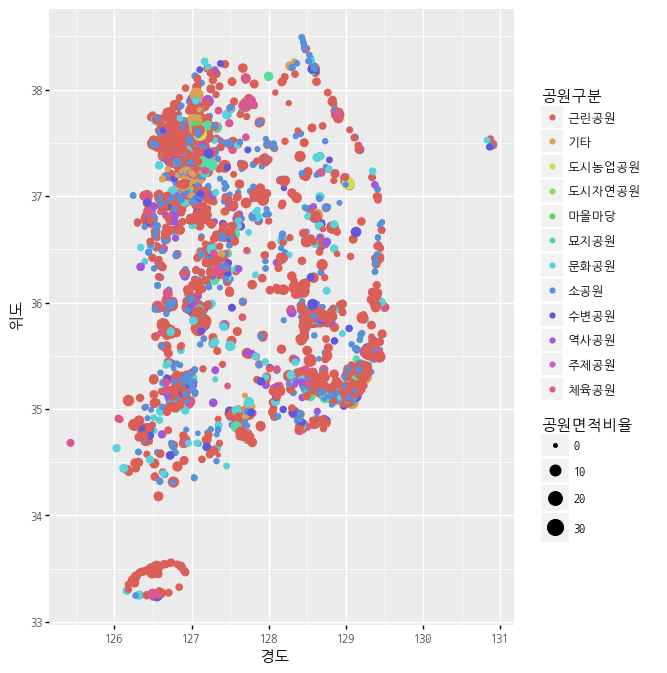

<ggplot: (105496784932)>

In [42]:
# 어린이 공원을 제외한 공원 분포
(
    ggplot(park_ok[park_ok['공원구분'] != '어린이공원'], aes(x='경도', y='위도', color='공원구분', size='공원면적비율'))
        + geom_point()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(6, 8))
)

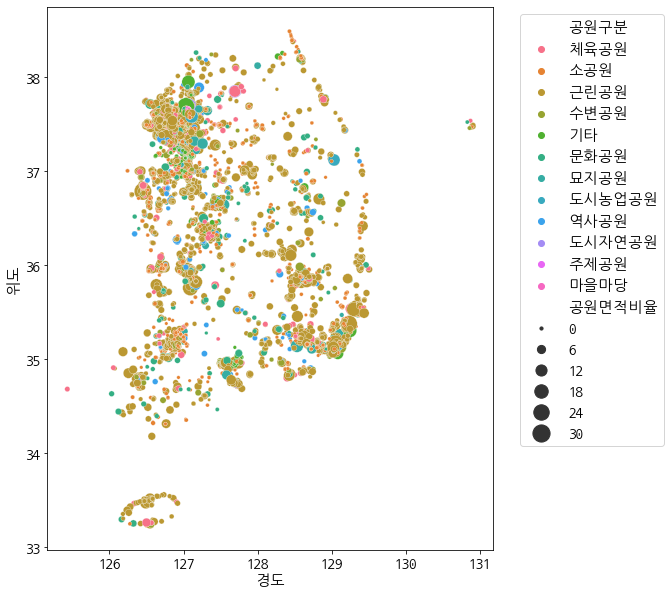

In [43]:
plt.figure(figsize=(8,10))
sns.scatterplot(data=park_ok[park_ok['공원구분'] != '어린이공원'], x='경도', y='위도', hue='공원구분', size='공원면적비율', sizes=(10, 300))
plt.legend(loc=1, bbox_to_anchor=(1.4, 1.0)) # 범례 위치
plt.show()

시도별 공원비율

In [44]:
# value_counts() 함수로 시도별 합계 데이터를 계산한다.
# value_counts() 함수에 normalize 옵션의 기본값은 False이고 합계를 계산하고, True로 변경하면 전체 함계에 대한 비율을 계산한다.
# value_counts() 함수에 ascending 옵션의 기본값은 False이고 내림차순을 정렬하고, True로 변경하면 오름차순으로 정렬한다.
# value_counts() 함수에 dropna 옵션의 기본값은 True이고 NaN을 무시하고, False로 변경하면 NaN을 포함시켜 계산한다.
park_do = pd.DataFrame(park_ok['시도'].value_counts()) # normalize=False, ascending=False, dropna=True
park_do.head()

,시도
경기도,4426
충청남도,1762
서울특별시,1759
경상남도,1163
전라남도,1038


In [45]:
park_do_normalize = pd.DataFrame(park_ok['시도'].value_counts(normalize=True))
park_do_normalize.head()

,시도
경기도,0.254280
충청남도,0.101229
서울특별시,0.101057
경상남도,0.066816
전라남도,0.059635


In [46]:
# 시도별 합계 데이터와 비율 데이터를 병합한다.
# 병합하려는 데이터프레임에 병합 기준을 인덱스로 지정하려면 left_index 옵션과 right_index 옵션을 True로 지정한다.
park_sido = park_do.merge(park_do_normalize, left_index=True, right_index=True).reset_index()

# 병합된 데이터프레임의 열 이름을 변경한다.
park_sido.columns = ['시도', '합계', '비율']
park_sido.sort_values(by=['합계'], ascending=True, inplace=True) # 합계에 대한 오름차순 정렬을 실행하고 데이터프레임에 바로 적용한다.
park_sido.sort_values(by=['합계'], inplace=True)
park_sido

,시도,합계,비율
16,세종특별자치시,70,0.004022
15,제주특별자치도,245,0.014076
14,대전광역시,445,0.025566
13,울산광역시,467,0.026830
12,대구광역시,631,0.036252
11,강원도,632,0.036309
10,전라북도,664,0.038148
9,부산광역시,674,0.038722
8,인천광역시,690,0.039642
7,충청북도,789,0.045329


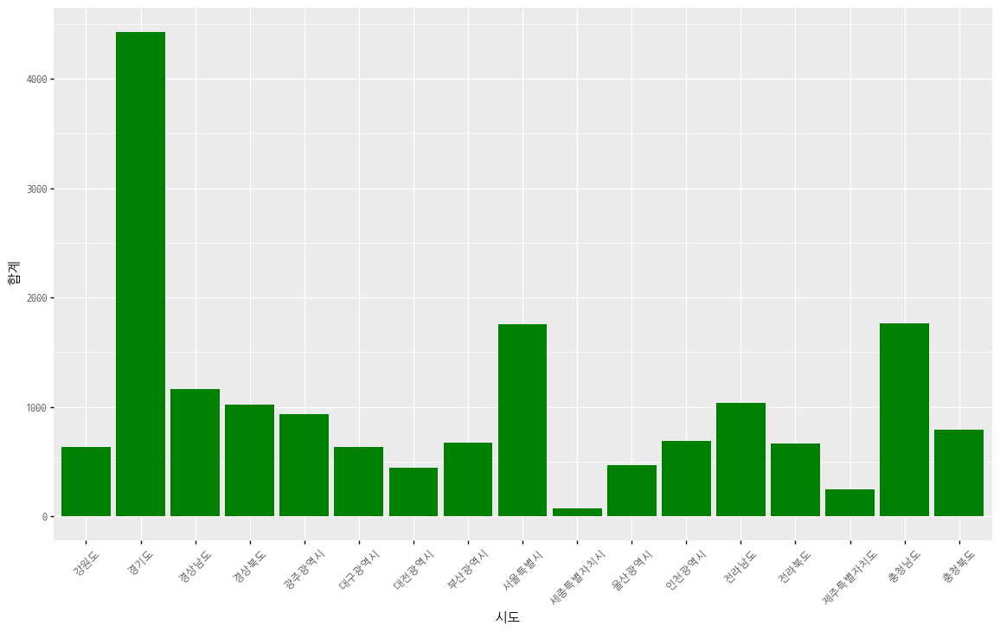

<ggplot: (105499911849)>

In [47]:
(
    ggplot(park_sido, aes(x='시도', y='합계'))
        + geom_bar(stat='identity', position='dodge', fill='green')
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(14, 8), axis_text_x=element_text(rotation=45)) 
)

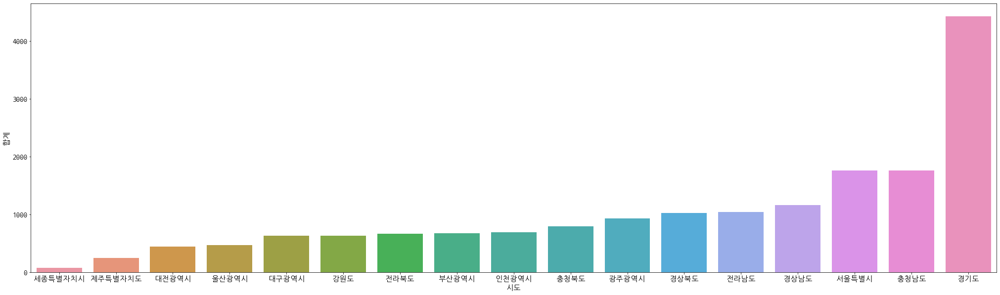

In [48]:
plt.figure(figsize=(35,10))
sns.barplot(data=park_sido, x='시도', y='합계')
plt.show()

https://plotnine.readthedocs.io/en/stable/tutorials/miscellaneous-order-plot-series.html

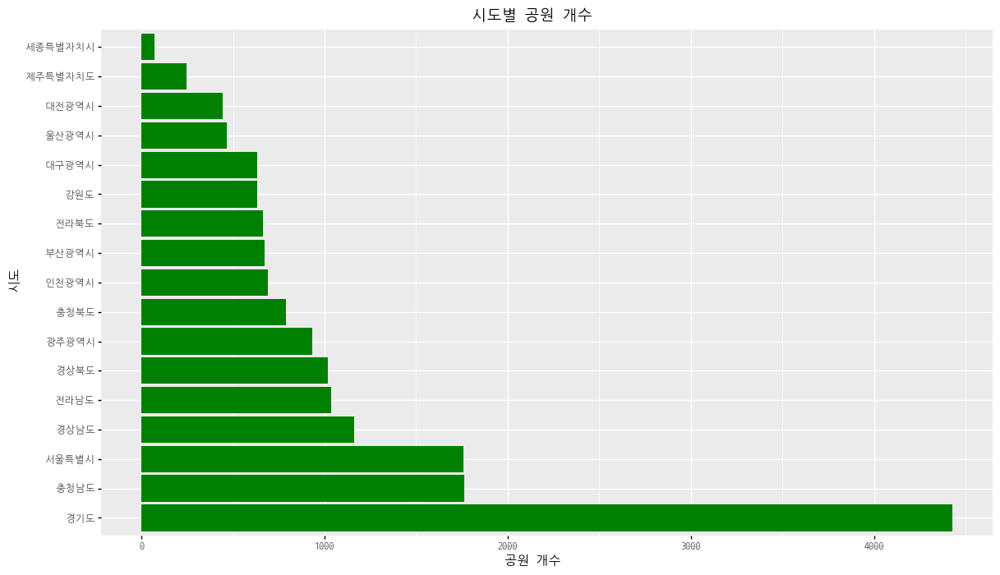

<ggplot: (-9223371931352306614)>

In [49]:
park_list = park_ok['시도'].value_counts().index.tolist()
parkList = pd.Categorical(park_ok['시도'], categories=park_list)
park_ok = park_ok.assign(공원목록 = parkList)

(ggplot(park_ok)
 + aes(x='공원목록')
 + geom_bar(size=20, fill='green')
 + coord_flip() # 차트의 x축, y축을 회전시킨다.
 + labs(y='공원 개수', x='시도', title='시도별 공원 개수')
 + theme(text=element_text(family='NanumGothicCoding'), figure_size=(14, 8)) 
)

공원 구분별 합계

In [50]:
park_type = pd.DataFrame(park_ok['공원구분'].value_counts()).reset_index()
park_type.columns = ['공원구분', '합계']
park_type

,공원구분,합계
0,어린이공원,9073
1,근린공원,3917
2,소공원,2603
3,기타,577
4,문화공원,374
5,수변공원,326
6,체육공원,250
7,역사공원,185
8,마을마당,49
9,묘지공원,38


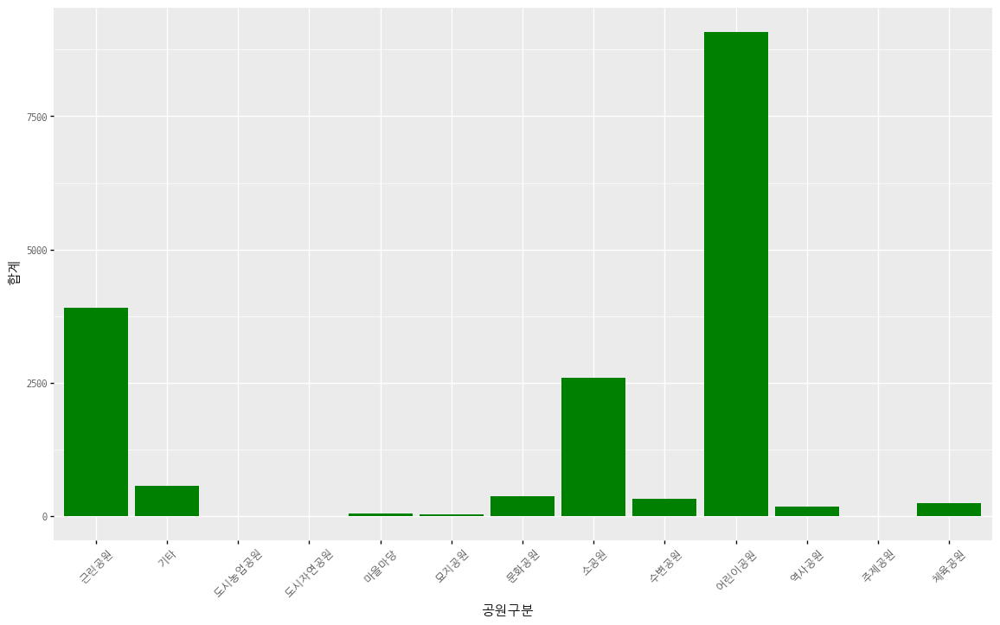

<ggplot: (-9223371931352340357)>

In [51]:
(
    ggplot(park_type, aes(x='공원구분', y='합계'))
        + geom_bar(stat='identity', position='dodge', fill='green')
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(14, 8), axis_text_x=element_text(rotation=45)) 
)

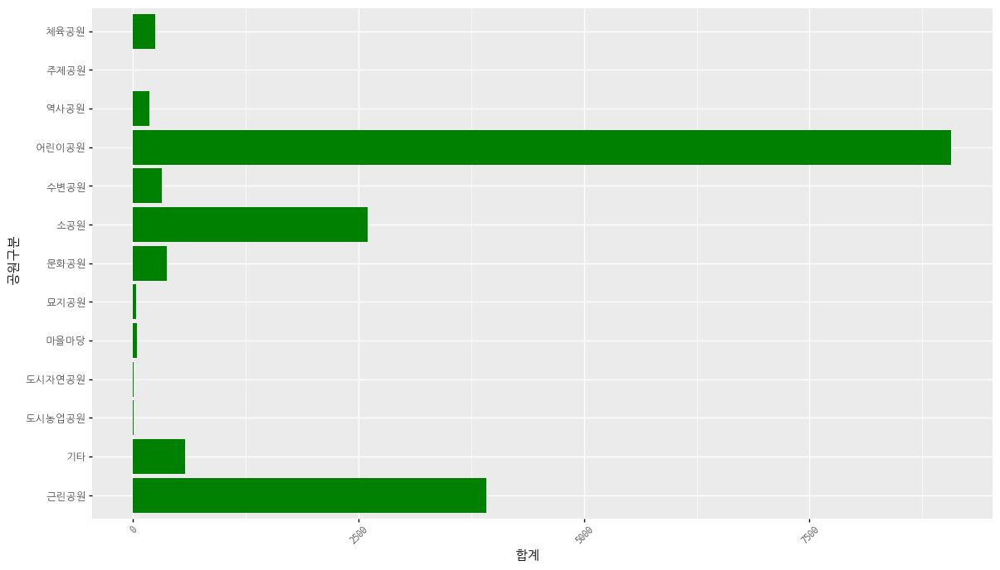

<ggplot: (-9223371931351818608)>

In [52]:
(
    ggplot(park_type, aes(x='공원구분', y='합계'))
        + geom_bar(stat='identity', position='dodge', fill='green')
        + coord_flip()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(14, 8), axis_text_x=element_text(rotation=45)) 
)

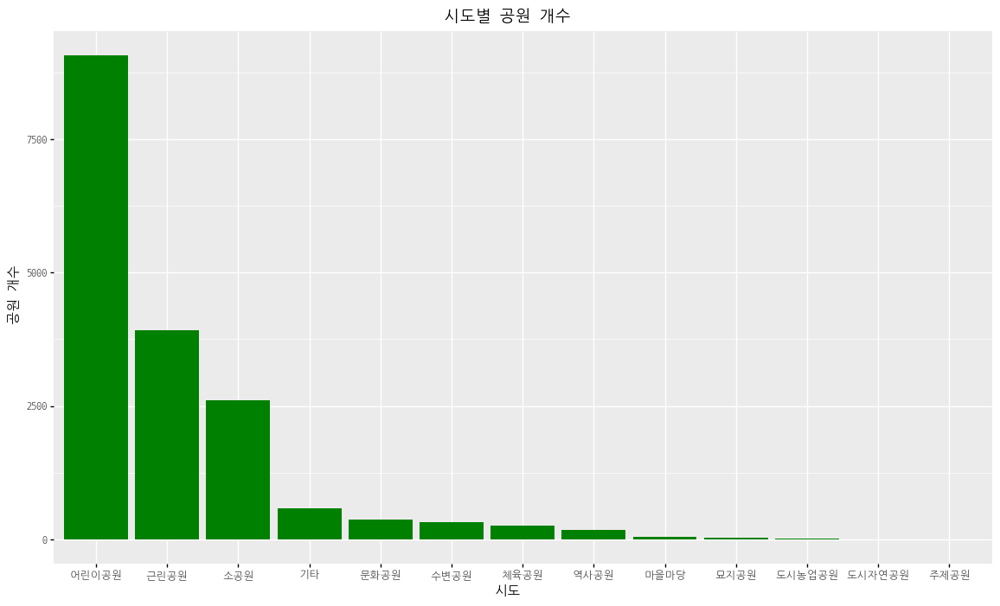

<ggplot: (-9223371931355273584)>

In [53]:
park_list = park_ok['공원구분'].value_counts().index.tolist()
parkList = pd.Categorical(park_ok['공원구분'], categories=park_list)
park_ok = park_ok.assign(공원목록 = parkList)

(ggplot(park_ok)
 + aes(x='공원목록')
 + geom_bar(size=20, fill='green')
 + labs(y='공원 개수', x='시도', title='시도별 공원 개수')
 + theme(text=element_text(family='NanumGothicCoding'), figure_size=(14, 8)) 
)

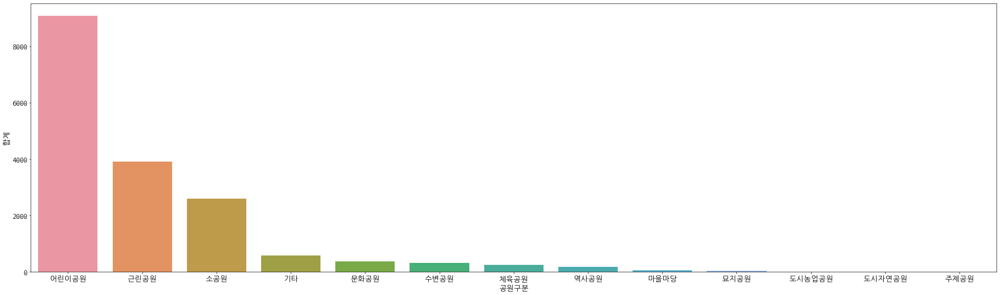

In [54]:
plt.figure(figsize=(35,10))
sns.barplot(data=park_type, x='공원구분', y='합계')
plt.show()

경기도 공원 분포

In [55]:
gyeonggi = park_ok[park_ok['시도'] == '경기도']
gyeonggi

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율,시도,주소2,주소3,주소4,공원목록
36,41590-00510,71호,기타,경기도 화성시 오산동 1030-20,경기도 화성시 오산동 1030-20,37.185729,127.102619,6934.0,031-5189-6961,2022-11-01,5530000,경기도 화성시,0.832706,경기도,화성시,오산동,1030-20,기타
80,41370-00108,세교2 제5호 수변공원,수변공원,경기도 오산시 금암동 198,경기도 오산시 금암동 198,37.169502,127.049281,1258.0,031-8036-6473,2022-04-30,4000000,경기도 오산시,0.354683,경기도,오산시,금암동,198,수변공원
81,41370-00109,원동수변공원,수변공원,경기도 오산시 부원로87번길 51,경기도 오산시 원동 715-8,37.140907,127.091507,17788.0,031-8036-6473,2022-04-30,4000000,경기도 오산시,1.333717,경기도,오산시,부원로87번길,51,수변공원
82,41370-00110,가장동체육공원,체육공원,경기도 오산시 가장산업동로 49,경기도 오산시 가장동 382-4,37.164782,127.041189,11856.0,031-8036-6473,2022-04-30,4000000,경기도 오산시,1.088853,경기도,오산시,가장산업동로,49,체육공원
107,41430-00111,근린공원,근린공원,경기도 의왕시 초평동 19-1,경기도 의왕시 초평동 19-1,37.318538,126.944477,14234.0,031-345-3083,2022-06-13,4030000,경기도 의왕시,1.193063,경기도,의왕시,초평동,19-1,근린공원
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17460,41461-00025,삼가지구 어린이공원1,어린이공원,경기도 용인시 처인구 삼가동 288-1,경기도 용인시 처인구 삼가동 288-1,37.238001,127.164249,4878.0,NaN,2022-11-23,4050000,경기도 용인시,0.698427,경기도,용인시,처인구,삼가동,어린이공원
17461,41461-00026,삼가1지구 체육공원,체육공원,경기도 용인시 처인구 삼가동 268-26,경기도 용인시 처인구 삼가동 268-26,37.238235,127.169302,17748.0,NaN,2022-11-23,4050000,경기도 용인시,1.332216,경기도,용인시,처인구,삼가동,체육공원
17462,41461-00027,제107호 어린이공원,어린이공원,경기도 용인시 처인구 모현읍 왕산리 949,경기도 용인시 처인구 모현읍 왕산리 949,37.333938,127.253862,5817.0,NaN,2022-11-23,4050000,경기도 용인시,0.762693,경기도,용인시,처인구,모현읍,어린이공원
17463,41461-00028,제105호 어린이공원,어린이공원,경기도 용인시 처인구 포곡읍 둔전리450,경기도 용인시 처인구 포곡읍 둔전리450,37.272922,127.221799,2558.0,NaN,2022-11-23,4050000,경기도 용인시,0.505767,경기도,용인시,처인구,포곡읍,어린이공원


In [56]:
gyeonggi_type = pd.DataFrame(gyeonggi['공원구분'].value_counts()).reset_index()
gyeonggi_type.columns = ['공원구분', '합계']
gyeonggi_type

,공원구분,합계
0,어린이공원,2126
1,근린공원,1008
2,소공원,512
3,기타,391
4,문화공원,123
5,수변공원,110
6,체육공원,104
7,역사공원,38
8,묘지공원,12
9,도시농업공원,2


In [57]:
gyeonggi_map = folium.Map(location=[gyeonggi['위도'].mean(), gyeonggi['경도'].mean()], zoom_start=10)
for i in gyeonggi.index:
    parkName = folium.Popup('{} - {}'.format(gyeonggi.loc[i, '공원명'], gyeonggi.loc[i, '소재지도로명주소']), max_width=1000)
    # print(parkName)
    folium.Marker(location=[gyeonggi.loc[i, '위도'], gyeonggi.loc[i, '경도']], popup=parkName).add_to(gyeonggi_map)
gyeonggi_map

수원시 공원 분포

In [58]:
suwon = park_ok[park_ok['주소2'] == '수원시']
suwon

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율,시도,주소2,주소3,주소4,공원목록
529,41113-00121,12호소공원,소공원,경기도 수원시 권선구 평동 13-236,경기도 수원시 권선구 평동 13-236,37.239795,127.055275,1315.3,031-228-6195,2022-06-20,3740000,경기도 수원시,0.362671,경기도,수원시,권선구,평동,소공원
1061,41111-00059,61호소공원,소공원,경기도 수원시 장안구 정조로 1053번길 36,경기도 수원시 장안구 송죽동 346-6,37.299249,127.003495,971.3,031-228-5995,2022-06-20,3740000,경기도 수원시,0.311657,경기도,수원시,장안구,정조로,소공원
1086,41111-00058,60호소공원,소공원,경기도 수원시 장안구 정자동 836-5,경기도 수원시 장안구 정자동 836-5,37.297441,126.998182,3482.0,031-228-5995,2022-06-20,3740000,경기도 수원시,0.590085,경기도,수원시,장안구,정자동,소공원
1137,41111-00057,40호소공원,소공원,경기도 수원시 장안구 정자동 569-11,경기도 수원시 장안구 정자동 569-11,37.310750,126.986922,2531.0,031-228-5995,2022-06-20,3740000,경기도 수원시,0.503090,경기도,수원시,장안구,정자동,소공원
4668,41111-00055,송원공원,소공원,경기도 수원시 장안구 조원동 912-2,경기도 수원시 장안구 조원동 912-2,37.307682,127.011315,3071.0,031-228-5995,2022-06-20,3740000,경기도 수원시,0.554166,경기도,수원시,장안구,조원동,소공원
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6667,41113-00010,솔대,근린공원,경기도 수원시 권선구 고색동 992,경기도 수원시 권선구 고색동 992,37.236185,126.981703,10354.0,031-228-6195,2022-06-20,3740000,경기도 수원시,1.017546,경기도,수원시,권선구,고색동,근린공원
6668,41113-00011,고색중보들,근린공원,경기도 수원시 권선구 고색동 1129,경기도 수원시 권선구 고색동 1129,37.248230,126.990030,138326.5,031-228-6195,2022-06-20,3740000,경기도 수원시,3.719227,경기도,수원시,권선구,고색동,근린공원
6669,41113-00012,들바람,근린공원,경기도 수원시 권선구 고색동 931,경기도 수원시 권선구 고색동 931,37.240728,126.978718,5186.7,031-228-6195,2022-06-20,3740000,경기도 수원시,0.720187,경기도,수원시,권선구,고색동,근린공원
6670,41113-00013,고렴,근린공원,경기도 수원시 권선구 곡반정동 546,경기도 수원시 권선구 곡반정동 546,37.240630,127.029210,10571.0,031-228-6195,2022-06-20,3740000,경기도 수원시,1.028154,경기도,수원시,권선구,곡반정동,근린공원


In [59]:
suwon_map = folium.Map(location=[suwon['위도'].mean(), suwon['경도'].mean()], zoom_start=14)
for i in suwon.index:
    parkName = folium.Popup('{} - {}'.format(suwon.loc[i, '공원명'], suwon.loc[i, '소재지도로명주소']), max_width=1000)
    # print(parkName)
    folium.Marker(location=[suwon.loc[i, '위도'], suwon.loc[i, '경도']], popup=parkName).add_to(suwon_map)
suwon_map

In [60]:
suwon_map = folium.Map(location=[suwon['위도'].mean(), suwon['경도'].mean()], zoom_start=12)
for i in suwon.index:
    parkName = folium.Popup('{} - {}'.format(suwon.loc[i, '공원명'], suwon.loc[i, '소재지도로명주소']), max_width=1000)
    # print(parkName)
    folium.CircleMarker(location=[suwon.loc[i, '위도'], suwon.loc[i, '경도']], popup=parkName,
                        radius=suwon.loc[i, '공원면적비율'] * 3, color='red', fill_color='white').add_to(suwon_map)
suwon_map

In [61]:
seoul = park_ok[park_ok['시도'] == '서울특별시']
seoul

,관리번호,공원명,공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,전화번호,데이터기준일자,제공기관코드,제공기관명,공원면적비율,시도,주소2,주소3,주소4,공원목록
310,11590-00045,나비,소공원,서울특별시 동작구 상도동 535-3,서울특별시 동작구 상도동 535-3,37.503346,126.943593,564.1,NaN,2022-04-25,3190000,서울특별시 동작구,0.237508,서울특별시,동작구,상도동,535-3,소공원
311,11590-00046,꽃담길,소공원,서울특별시 동작구 상도동 25-8,서울특별시 동작구 상도동 25-8,37.505644,126.942102,206.0,NaN,2022-04-25,3190000,서울특별시 동작구,0.143527,서울특별시,동작구,상도동,25-8,소공원
312,11590-00047,흑석,소공원,서울특별시 동작구 흑석동 186-135,서울특별시 동작구 흑석동 186-135,37.509161,126.957863,442.0,NaN,2022-04-25,3190000,서울특별시 동작구,0.210238,서울특별시,동작구,흑석동,186-135,소공원
313,11590-00048,칸나,소공원,서울특별시 동작구 시흥대로596,서울특별시 동작구 신대방동 698,37.485627,126.904308,241.0,NaN,2022-04-25,3190000,서울특별시 동작구,0.155242,서울특별시,동작구,시흥대로596,None,소공원
314,11590-00049,꿈나래,어린이공원,서울특별시 동작구 상도동 36-1,서울특별시 동작구 상도동 36-1,37.505268,126.948180,1720.2,NaN,2022-04-25,3190000,서울특별시 동작구,0.414753,서울특별시,동작구,상도동,36-1,어린이공원
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17404,11500-00001,우장,근린공원,서울특별시 강서구 우장산로 72,서울특별시 강서구 화곡동 산60-1,37.552820,126.843808,359435.2,02-2600-4185,2022-03-16,3150000,서울특별시 강서구,5.995291,서울특별시,강서구,우장산로,72,근린공원
17405,11500-00002,궁산,근린공원,서울특별시 강서구 가양동 산4-7,서울특별시 강서구 가양동 산4-7,37.574254,126.841332,135002.7,02-2600-4185,2022-03-16,3150000,서울특별시 강서구,3.674271,서울특별시,강서구,가양동,산4-7,근린공원
17406,11500-00003,염창,근린공원,서울특별시 강서구 양천로67길 43,서울특별시 강서구 염창동 산24-1,37.557007,126.869821,112070.0,02-2600-4186,2022-03-16,3150000,서울특별시 강서구,3.347686,서울특별시,강서구,양천로67길,43,근린공원
17407,11500-00004,꿩고개,근린공원,서울특별시 강서구 방화동 산97-1,서울특별시 강서구 방화동 산97-1,37.577983,126.808105,180000.0,02-2600-4186,2022-03-16,3150000,서울특별시 강서구,4.242641,서울특별시,강서구,방화동,산97-1,근린공원


In [62]:
seoul_map = folium.Map(location=[seoul['위도'].mean(), seoul['경도'].mean()], zoom_start=12)
for i in seoul.index:
    parkName = folium.Popup('{} - {}'.format(seoul.loc[i, '공원명'], seoul.loc[i, '소재지도로명주소']), max_width=1000)
    # print(parkName)
    folium.CircleMarker(location=[seoul.loc[i, '위도'], seoul.loc[i, '경도']], popup=parkName,
                        radius=seoul.loc[i, '공원면적비율'] * 3, color='red', fill_color='white').add_to(seoul_map)
seoul_map